# Vehicle Detection Project


The goals / steps of this project are the following:

    - Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train 
      a classifier Linear SVM classifier
    - Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, 
      to your HOG feature vector.
    - Note: for those first two steps don't forget to normalize your features and randomize a selection for training 
      and testing.
    - Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
    - Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) 
      and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
    - Estimate a bounding box for vehicles detected.

Histogram of Oriented Gradients (HOG)
1. Explain how (and identify where in your code) you extracted HOG features from the training images.

The code for this step is contained in the first code cell of the IPython notebook (or in lines # through # of the file called some_file.py).

I started by reading in all the vehicle and non-vehicle images. Here is an example of one of each of the vehicle and non-vehicle classes:

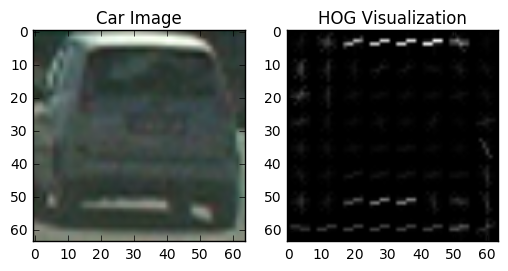

Object type:  Car Image    Color Space: RGB       HOG channel: ALL
-----------------------------------------------------------------------------------------------


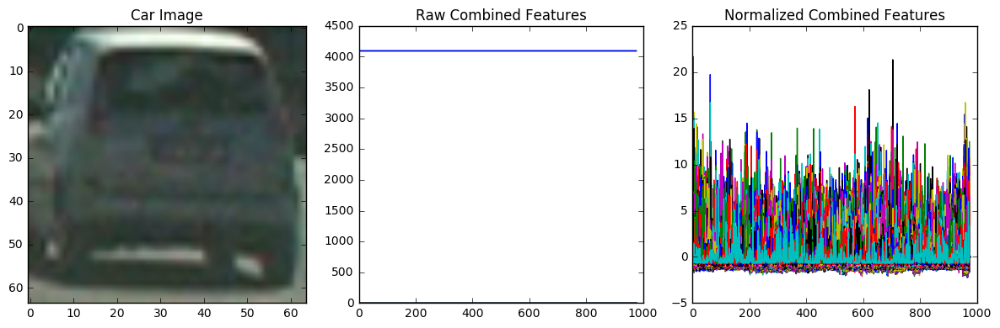

Object type:  Car Image    Color Space: HSV       HOG channel: ALL
-----------------------------------------------------------------------------------------------


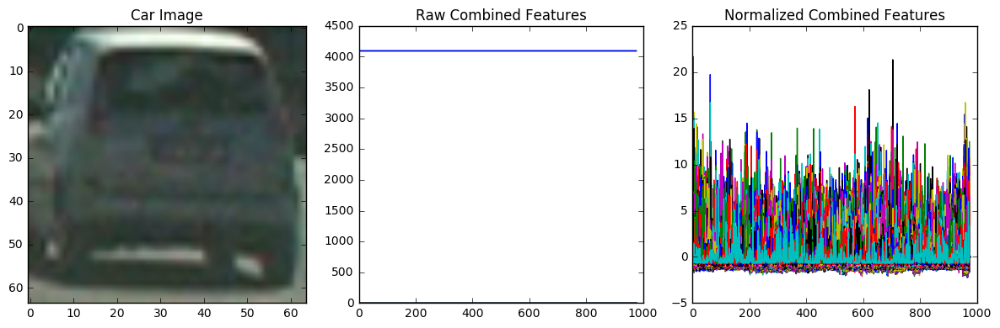

Object type:  Car Image    Color Space: LUV       HOG channel: ALL
-----------------------------------------------------------------------------------------------


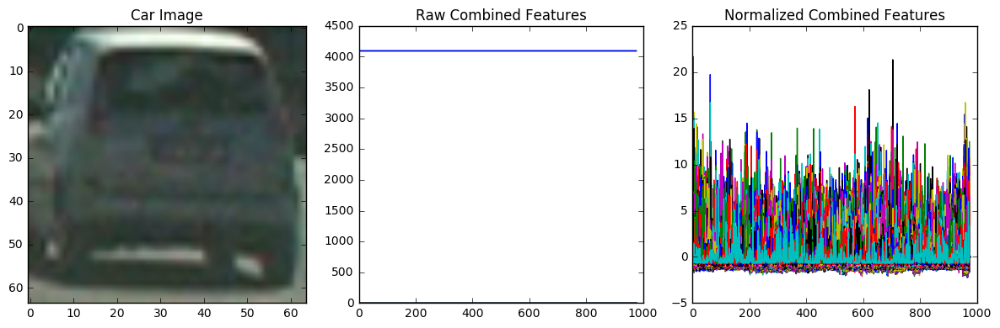

Object type:  Car Image    Color Space: HLS       HOG channel: ALL
-----------------------------------------------------------------------------------------------


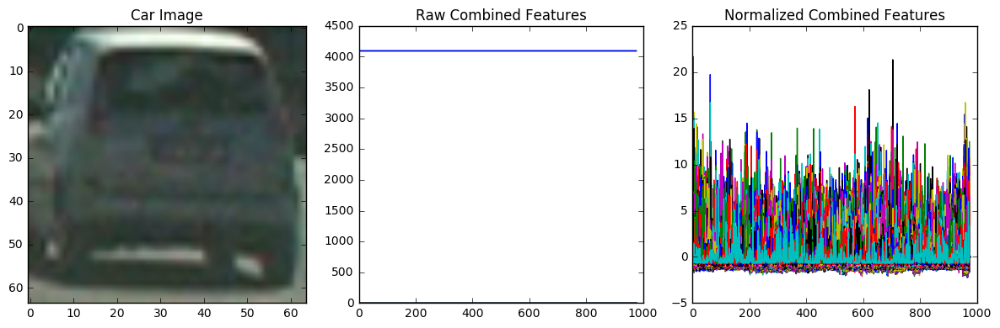

Object type:  Car Image    Color Space: YUV       HOG channel: ALL
-----------------------------------------------------------------------------------------------


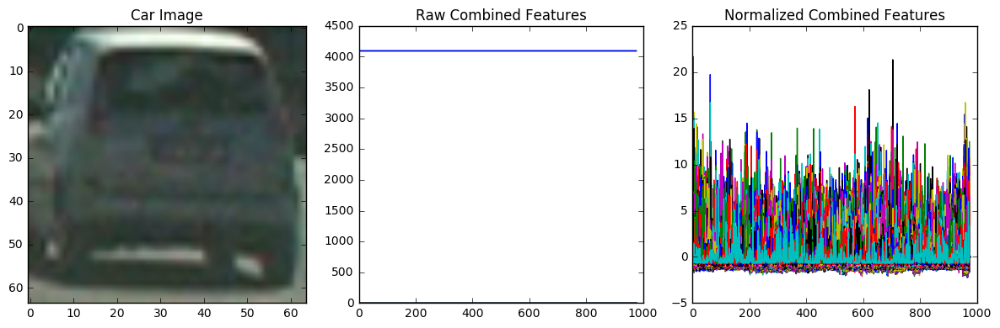

Object type:  Car Image    Color Space: YCrCb       HOG channel: ALL
-----------------------------------------------------------------------------------------------


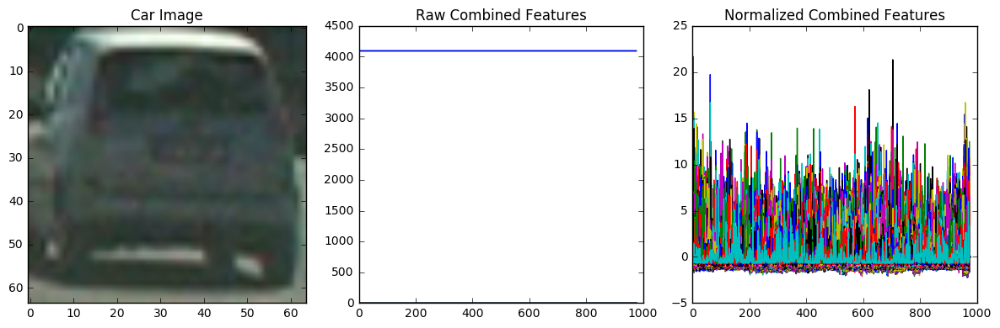

Object type:  Car Image    Color Space: RGB       HOG channel: 0
-----------------------------------------------------------------------------------------------


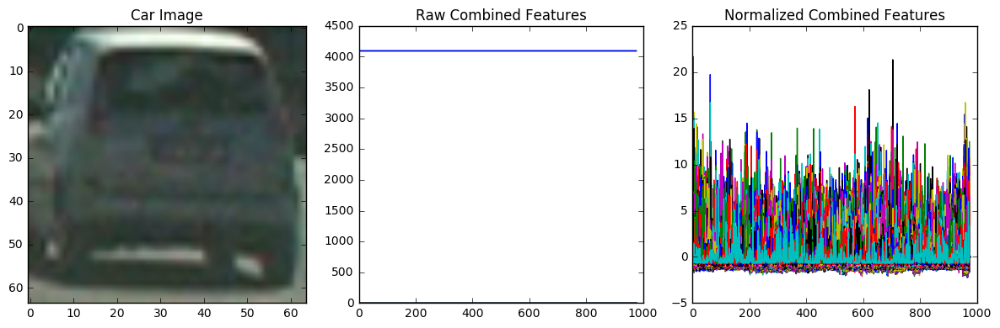

Object type:  Car Image    Color Space: HSV       HOG channel: 0
-----------------------------------------------------------------------------------------------


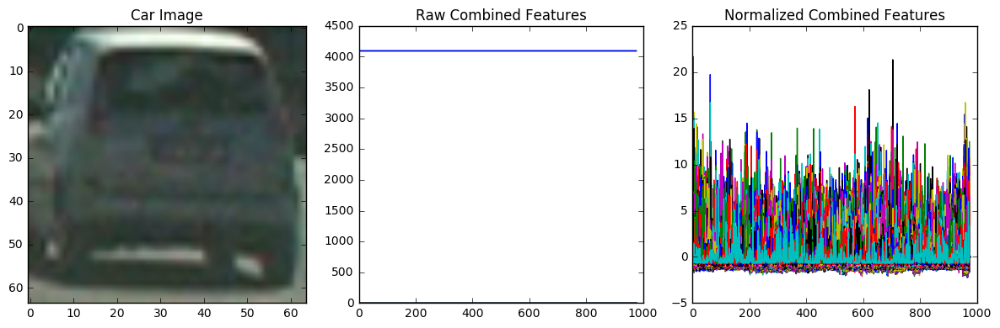

Object type:  Car Image    Color Space: LUV       HOG channel: 0
-----------------------------------------------------------------------------------------------


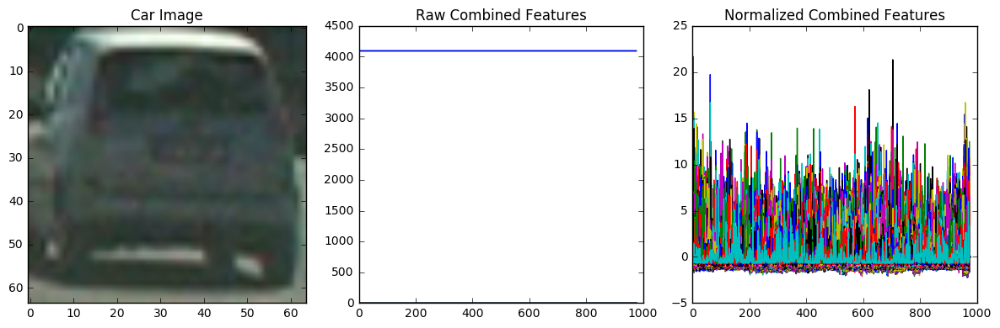

Object type:  Car Image    Color Space: HLS       HOG channel: 0
-----------------------------------------------------------------------------------------------


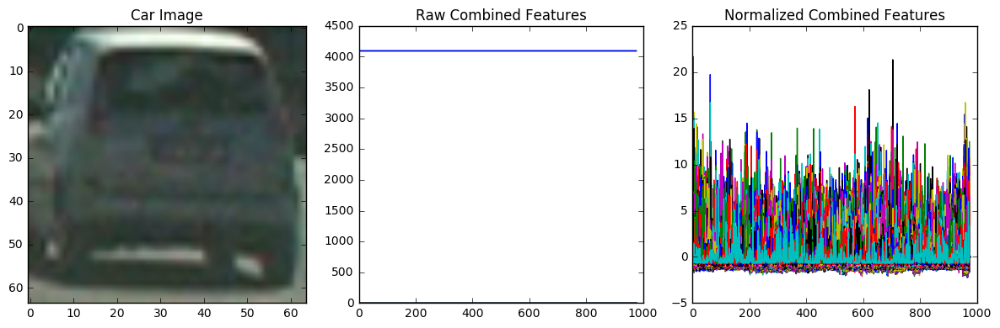

Object type:  Car Image    Color Space: YUV       HOG channel: 0
-----------------------------------------------------------------------------------------------


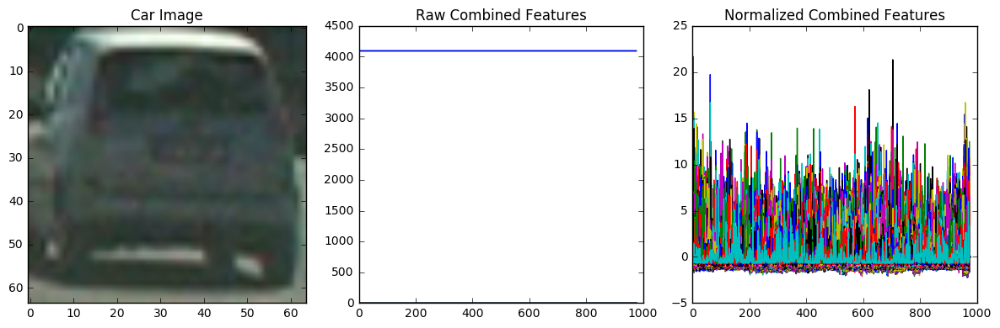

Object type:  Car Image    Color Space: YCrCb       HOG channel: 0
-----------------------------------------------------------------------------------------------


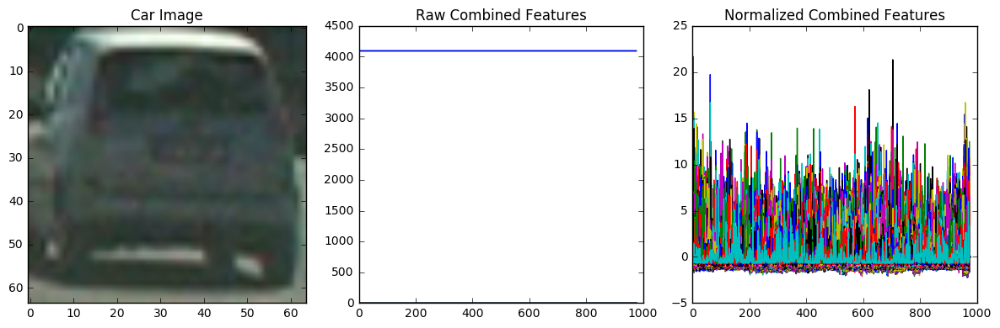

Object type:  Car Image    Color Space: RGB       HOG channel: 1
-----------------------------------------------------------------------------------------------


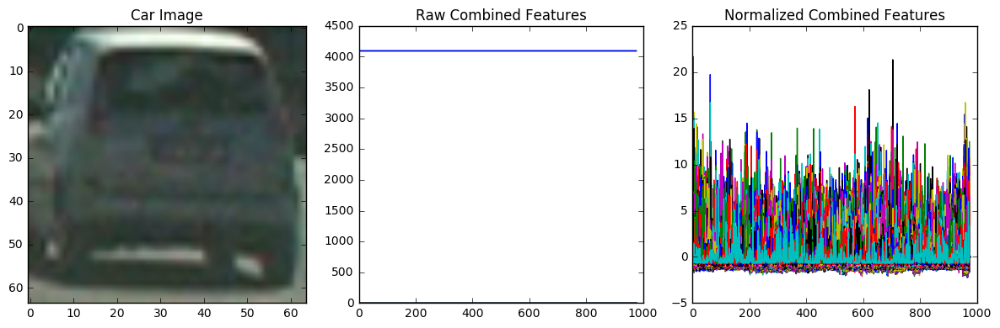

Object type:  Car Image    Color Space: HSV       HOG channel: 1
-----------------------------------------------------------------------------------------------


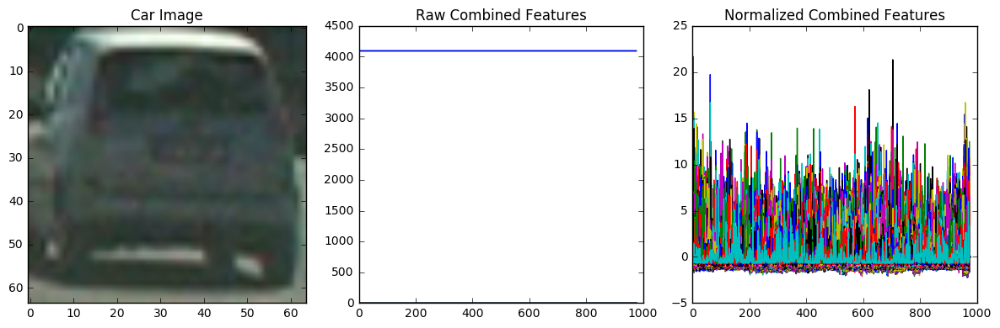

Object type:  Car Image    Color Space: LUV       HOG channel: 1
-----------------------------------------------------------------------------------------------


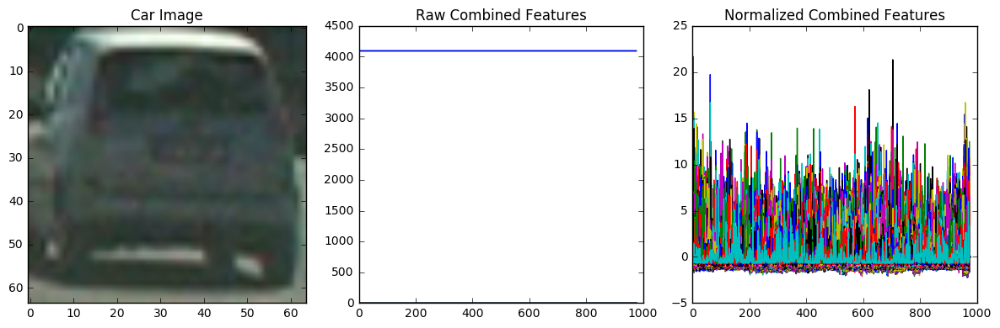

Object type:  Car Image    Color Space: HLS       HOG channel: 1
-----------------------------------------------------------------------------------------------


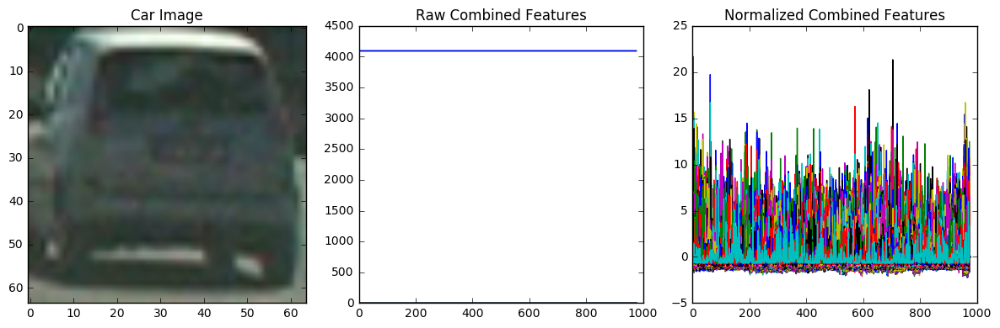

Object type:  Car Image    Color Space: YUV       HOG channel: 1
-----------------------------------------------------------------------------------------------


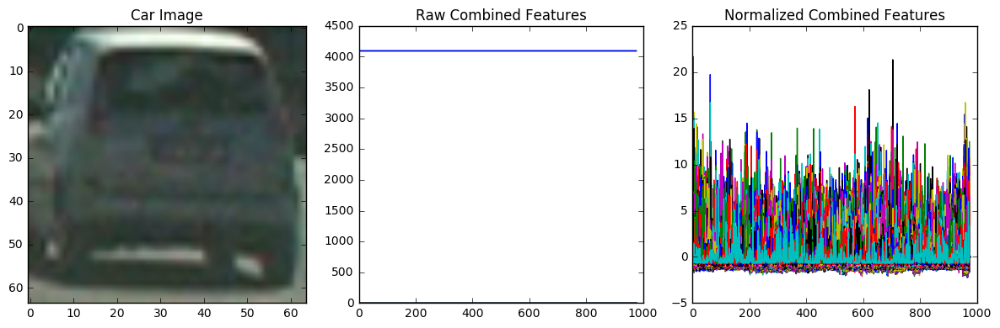

Object type:  Car Image    Color Space: YCrCb       HOG channel: 1
-----------------------------------------------------------------------------------------------


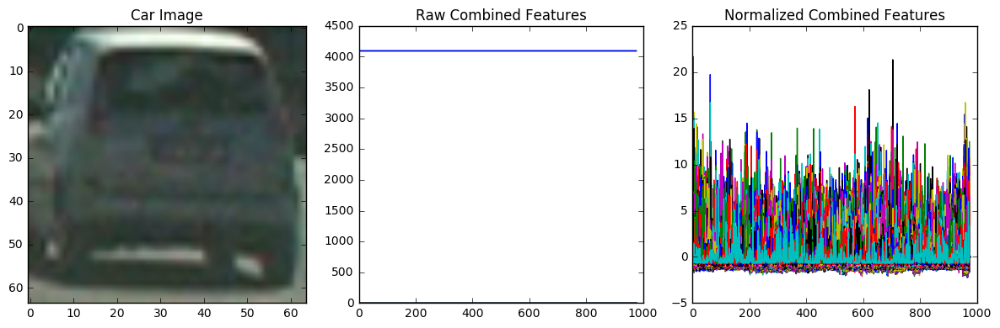

Object type:  Car Image    Color Space: RGB       HOG channel: 2
-----------------------------------------------------------------------------------------------


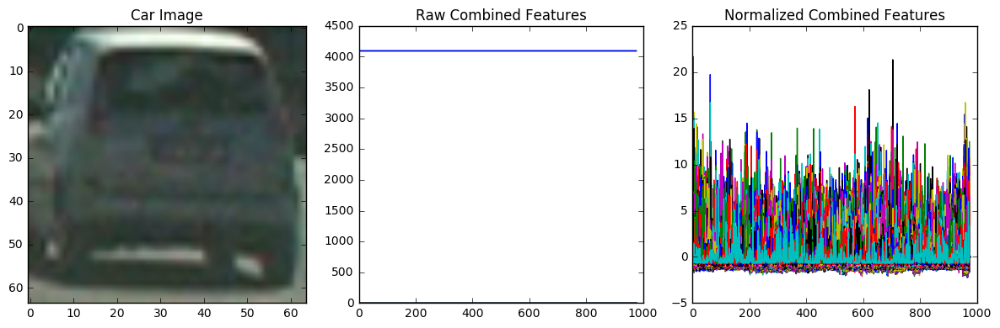

Object type:  Car Image    Color Space: HSV       HOG channel: 2
-----------------------------------------------------------------------------------------------


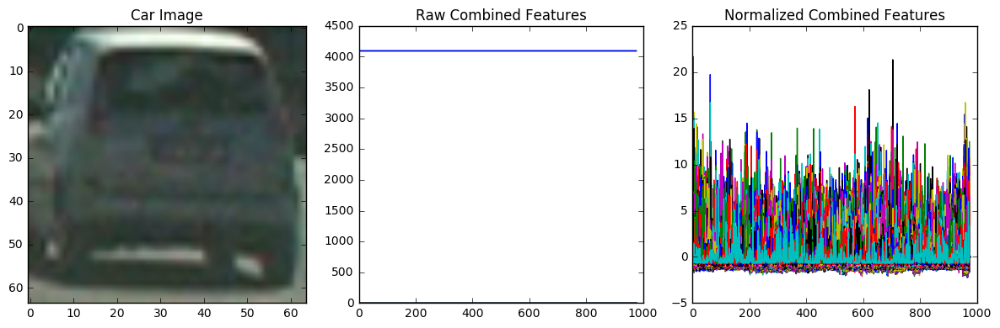

Object type:  Car Image    Color Space: LUV       HOG channel: 2
-----------------------------------------------------------------------------------------------


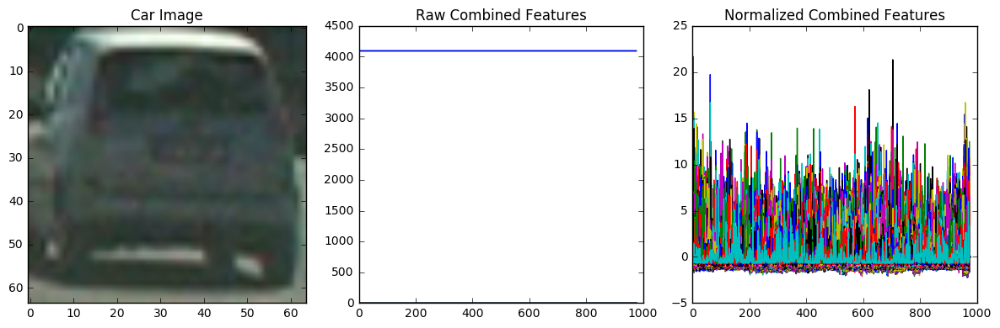

Object type:  Car Image    Color Space: HLS       HOG channel: 2
-----------------------------------------------------------------------------------------------


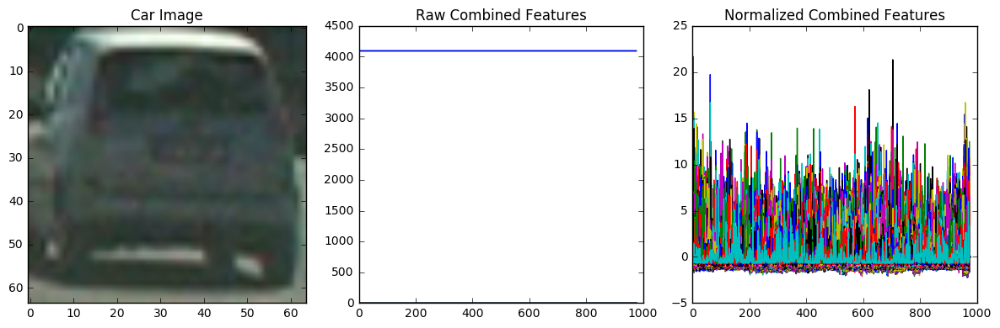

Object type:  Car Image    Color Space: YUV       HOG channel: 2
-----------------------------------------------------------------------------------------------


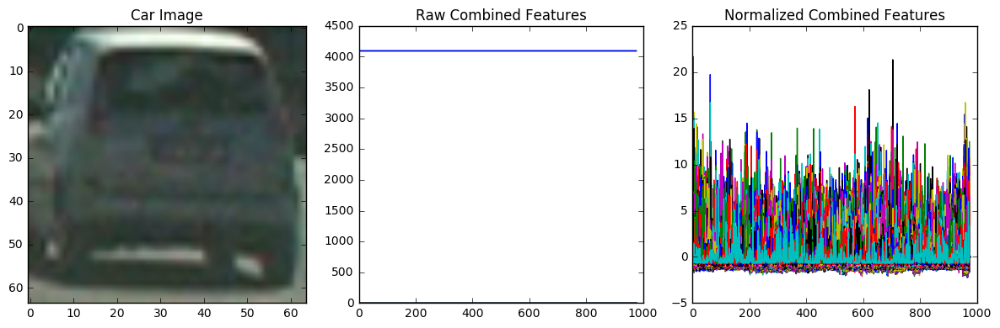

Object type:  Car Image    Color Space: YCrCb       HOG channel: 2
-----------------------------------------------------------------------------------------------


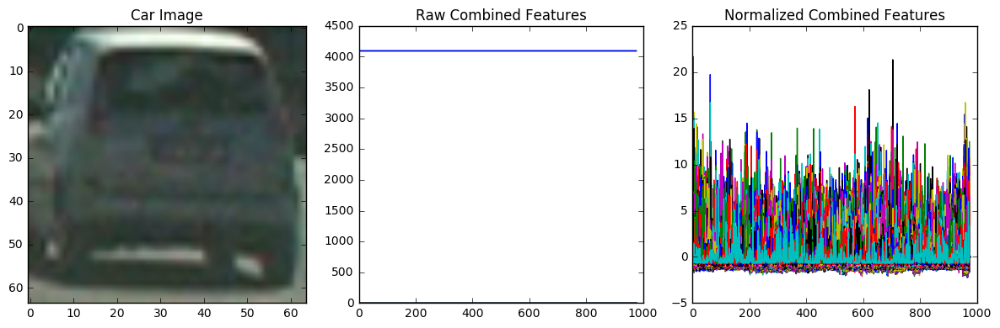

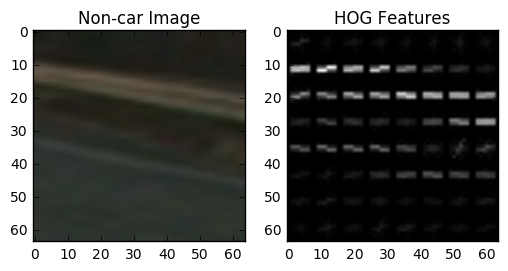

Object type:  Non-car Image    Color Space: RGB       HOG channel: ALL
-----------------------------------------------------------------------------------------------


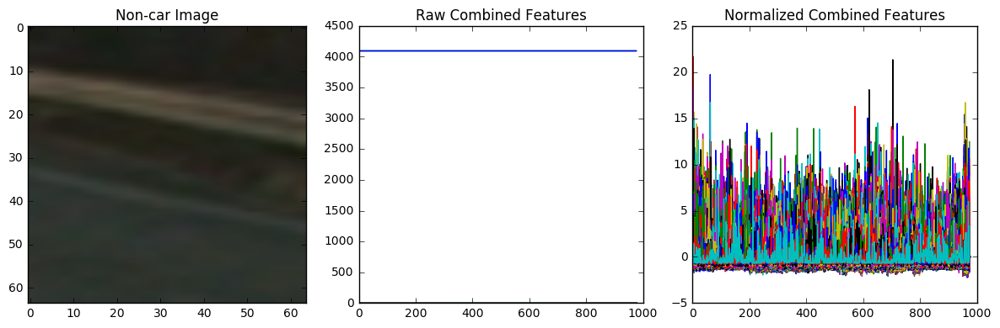

Object type:  Non-car Image    Color Space: HSV       HOG channel: ALL
-----------------------------------------------------------------------------------------------


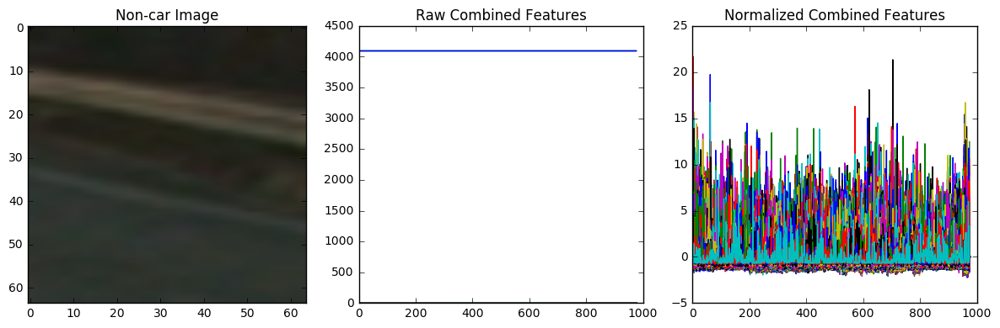

Object type:  Non-car Image    Color Space: LUV       HOG channel: ALL
-----------------------------------------------------------------------------------------------


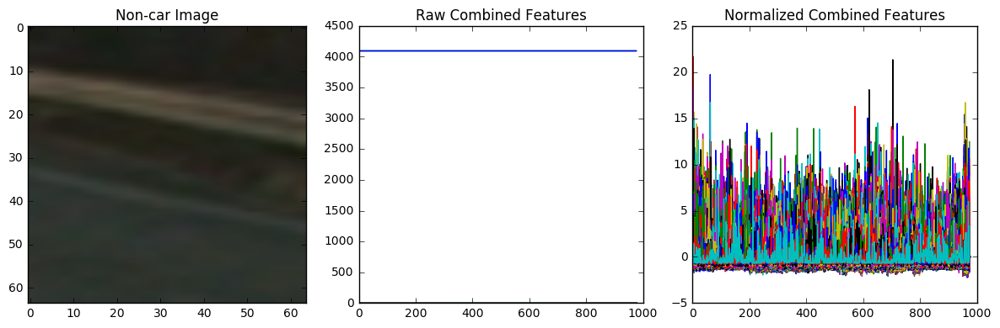

Object type:  Non-car Image    Color Space: HLS       HOG channel: ALL
-----------------------------------------------------------------------------------------------


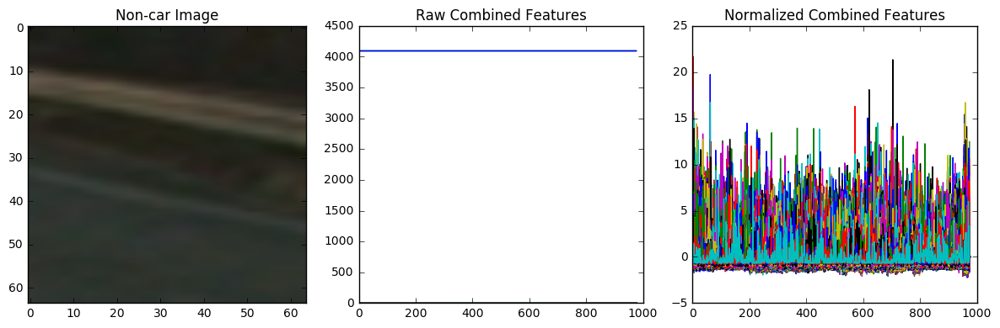

Object type:  Non-car Image    Color Space: YUV       HOG channel: ALL
-----------------------------------------------------------------------------------------------


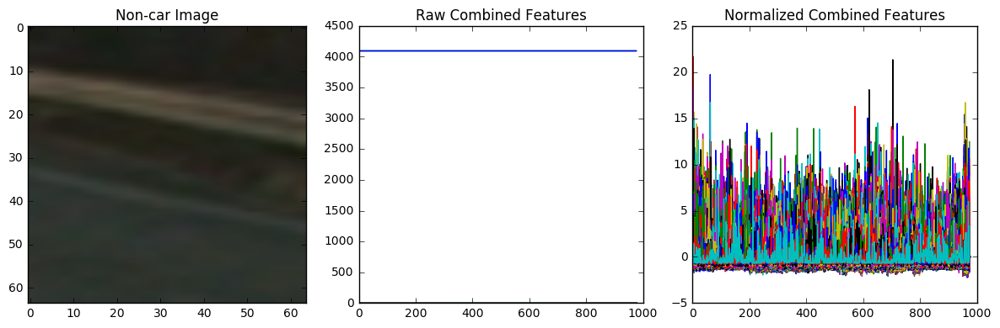

Object type:  Non-car Image    Color Space: YCrCb       HOG channel: ALL
-----------------------------------------------------------------------------------------------


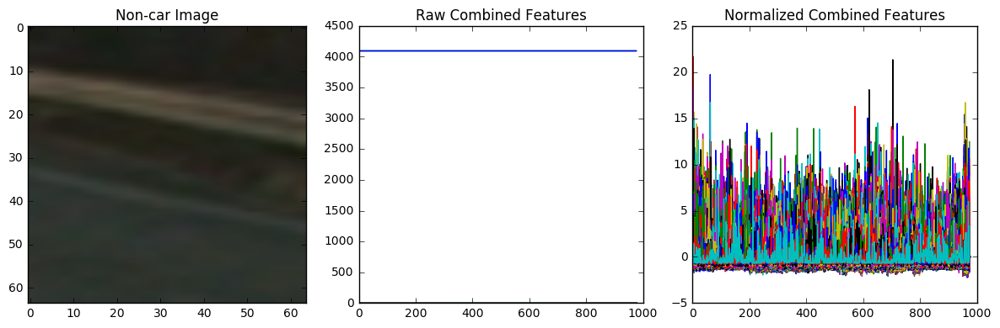

Object type:  Non-car Image    Color Space: RGB       HOG channel: 0
-----------------------------------------------------------------------------------------------


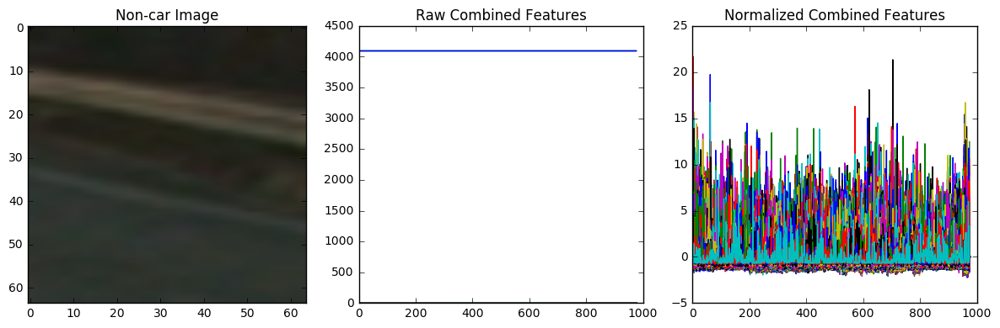

Object type:  Non-car Image    Color Space: HSV       HOG channel: 0
-----------------------------------------------------------------------------------------------


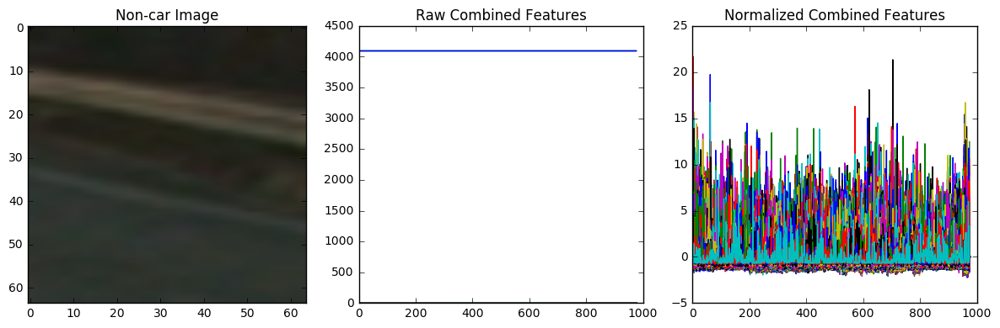

Object type:  Non-car Image    Color Space: LUV       HOG channel: 0
-----------------------------------------------------------------------------------------------


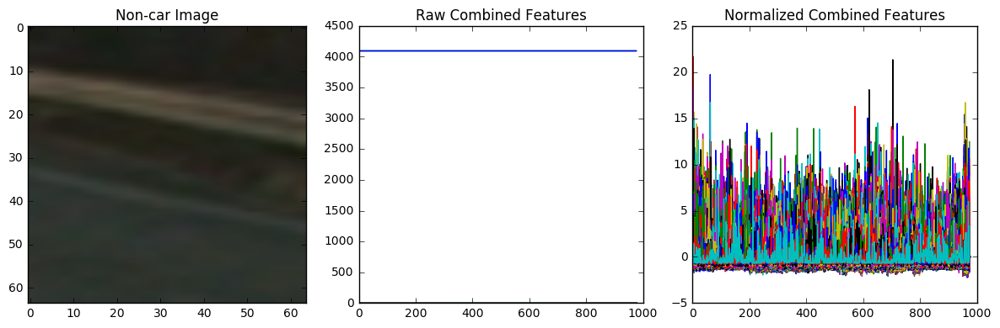

Object type:  Non-car Image    Color Space: HLS       HOG channel: 0
-----------------------------------------------------------------------------------------------


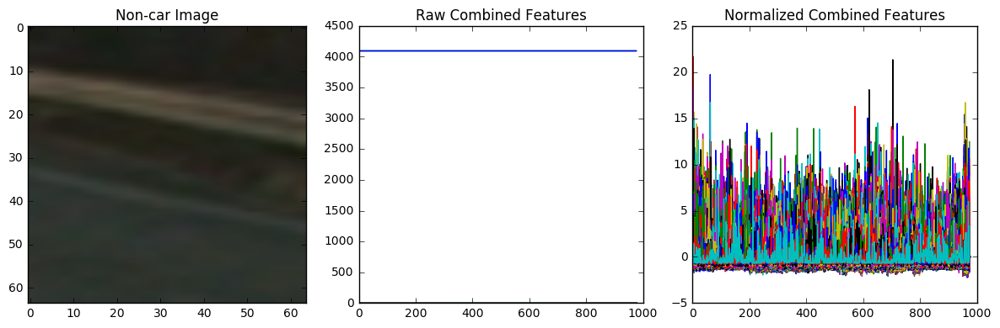

Object type:  Non-car Image    Color Space: YUV       HOG channel: 0
-----------------------------------------------------------------------------------------------


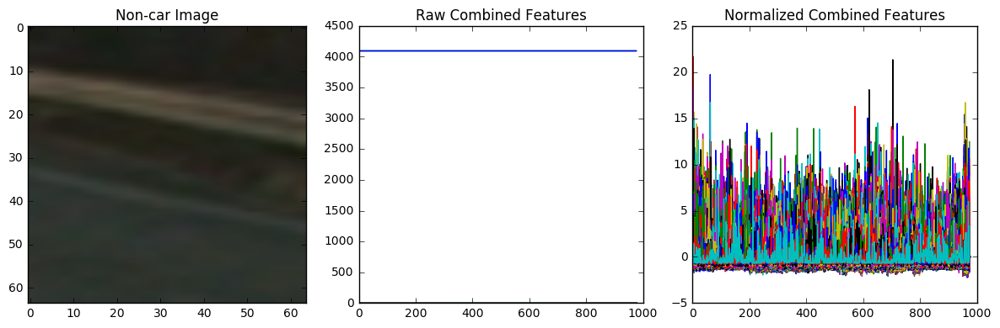

Object type:  Non-car Image    Color Space: YCrCb       HOG channel: 0
-----------------------------------------------------------------------------------------------


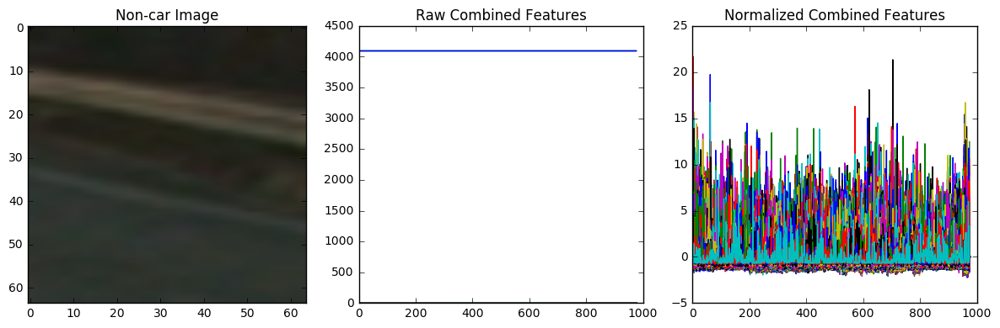

Object type:  Non-car Image    Color Space: RGB       HOG channel: 1
-----------------------------------------------------------------------------------------------


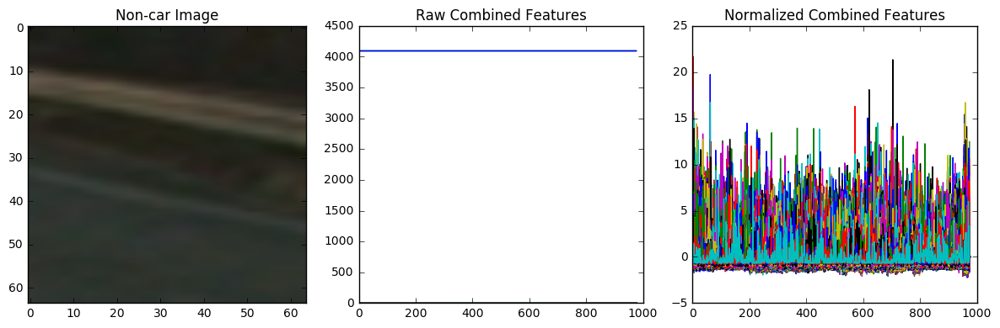

Object type:  Non-car Image    Color Space: HSV       HOG channel: 1
-----------------------------------------------------------------------------------------------


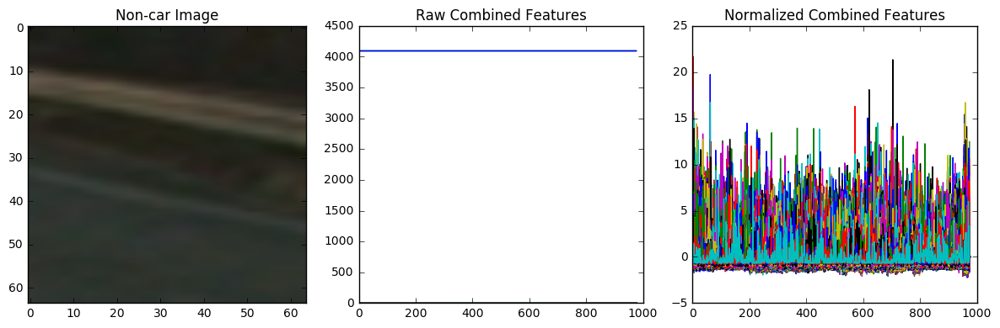

Object type:  Non-car Image    Color Space: LUV       HOG channel: 1
-----------------------------------------------------------------------------------------------


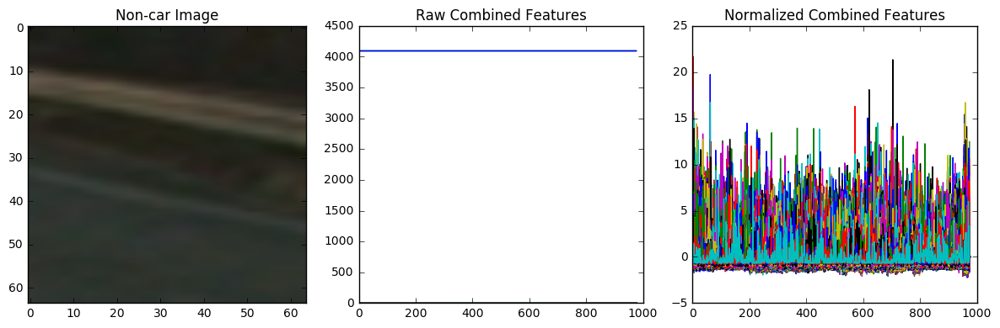

Object type:  Non-car Image    Color Space: HLS       HOG channel: 1
-----------------------------------------------------------------------------------------------


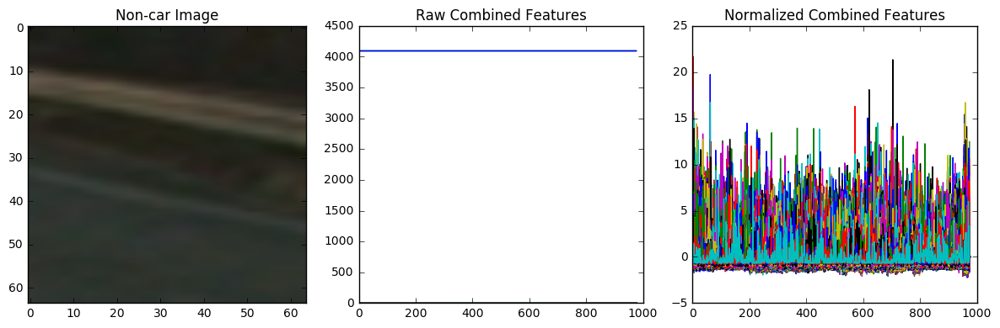

Object type:  Non-car Image    Color Space: YUV       HOG channel: 1
-----------------------------------------------------------------------------------------------


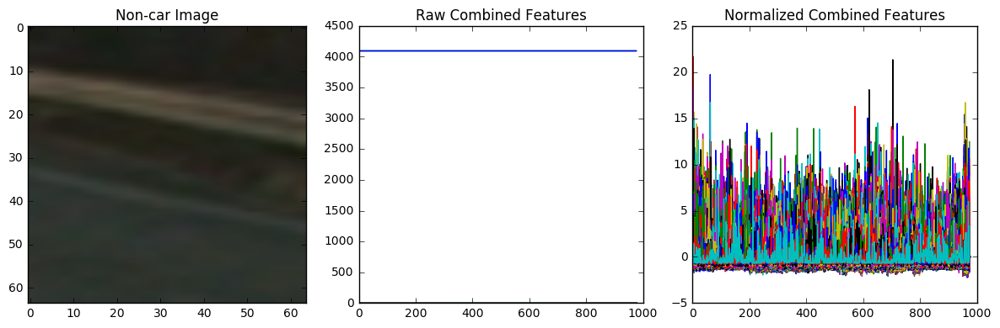

Object type:  Non-car Image    Color Space: YCrCb       HOG channel: 1
-----------------------------------------------------------------------------------------------


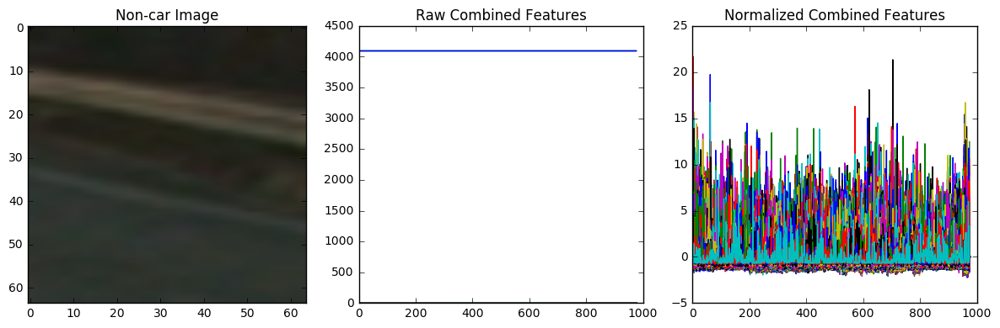

Object type:  Non-car Image    Color Space: RGB       HOG channel: 2
-----------------------------------------------------------------------------------------------


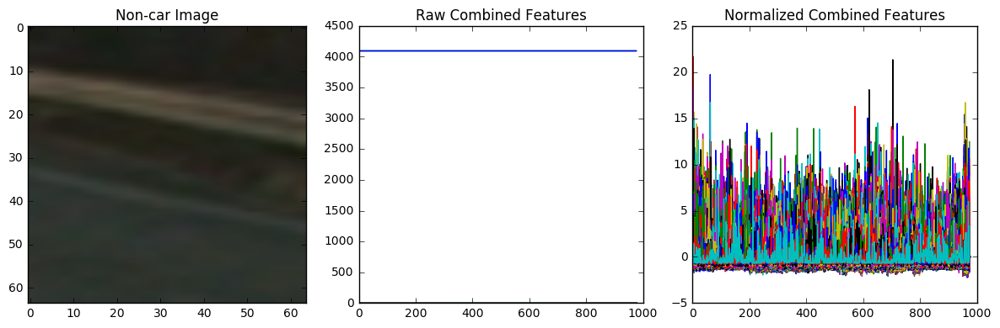

Object type:  Non-car Image    Color Space: HSV       HOG channel: 2
-----------------------------------------------------------------------------------------------


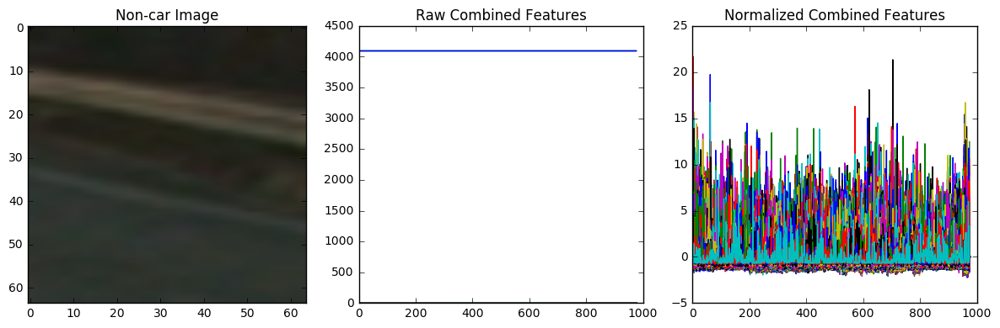

Object type:  Non-car Image    Color Space: LUV       HOG channel: 2
-----------------------------------------------------------------------------------------------


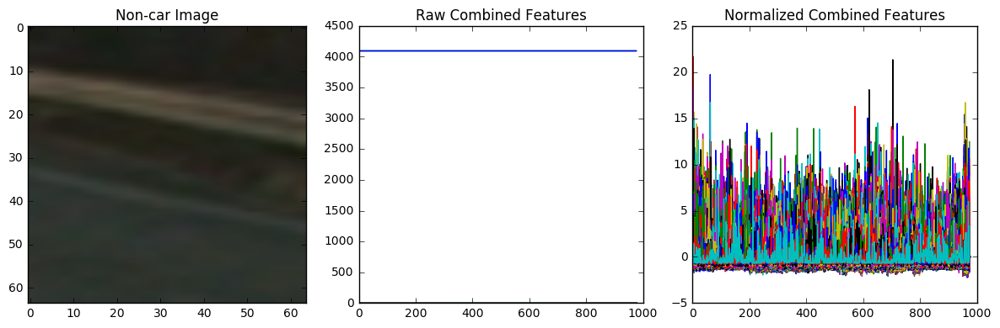

Object type:  Non-car Image    Color Space: HLS       HOG channel: 2
-----------------------------------------------------------------------------------------------


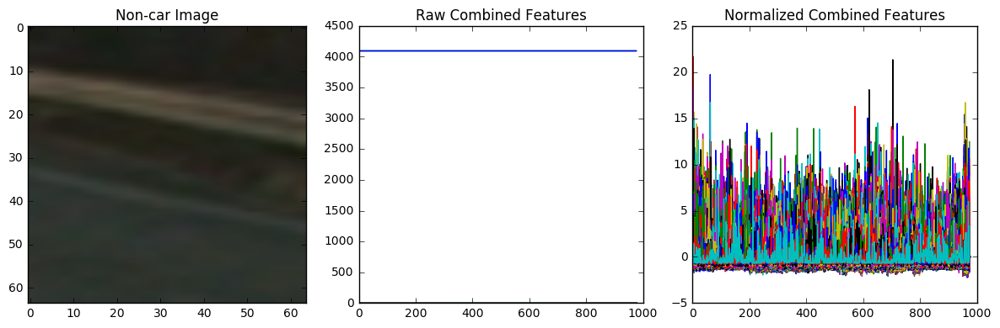

Object type:  Non-car Image    Color Space: YUV       HOG channel: 2
-----------------------------------------------------------------------------------------------


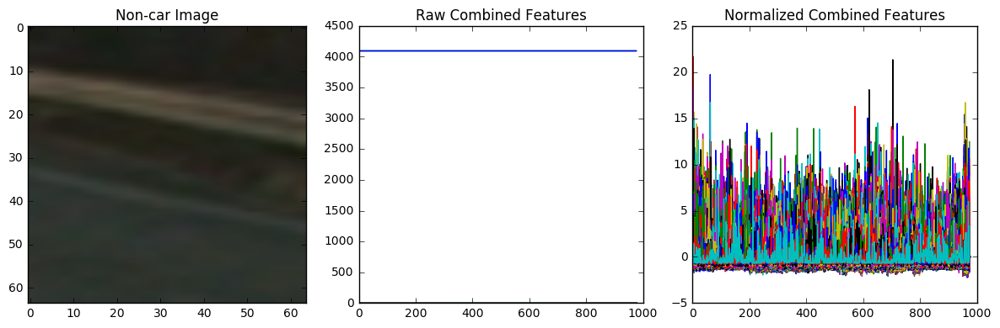

Object type:  Non-car Image    Color Space: YCrCb       HOG channel: 2
-----------------------------------------------------------------------------------------------


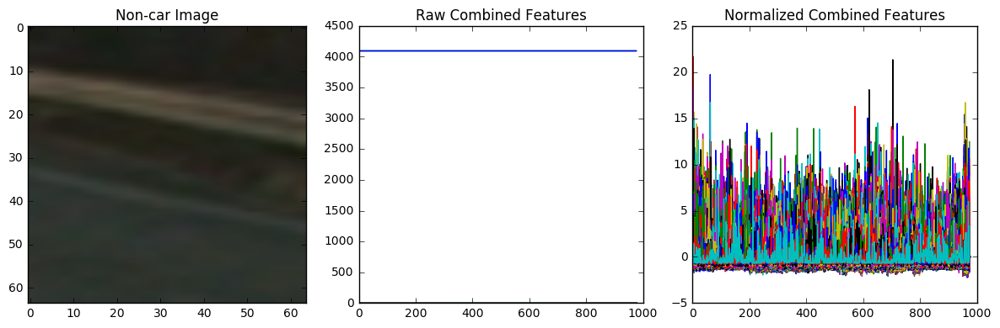

In [46]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler


# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features    

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        # Use skimage.hog() to get both features and a visualization
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        # Use skimage.hog() to get features only
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
        return features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist() and get_hog_features
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        
        #Gaussian blur
        kernel_size = 5
        image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
        
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    

def imgColorConvert(feature_image, cspace):
# apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        if cspace == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)   
    return feature_image

def plotHogImg(image, imgs, type, colorspace, hog_channel, orient=9, 
                        pix_per_cell=8, cell_per_block=2, 
                        spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256)):
    #image = imgColorConvert(image, colorspace)
    
    # Call get_hog_features() with vis=False, feature_vec=True
    if (hog_channel == "ALL"):
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
        features, hog_image = get_hog_features(gray, orient,
                pix_per_cell, cell_per_block, 
                vis=True, feature_vec=False)    
    else:
        features, hog_image = get_hog_features(image[:,:,hog_channel], orient,
                pix_per_cell, cell_per_block, 
                vis=True, feature_vec=False)
                
    print("Object type:  {}    Color Space: {}       HOG channel: {}".format(type, colorspace, hog_channel))
    print("-----------------------------------------------------------------------------------------------")
    # Plot the examples
    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title('Car Image')
    plt.subplot(122)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG Visualization')
    plt.show()

    features = extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=hog_channel,
                        spatial_feat=True, hist_feat=True, hog_feat=True)
    
    if len(features) > 0:
        # Create an array stack of feature vectors
        X = np.vstack((features)).astype(np.float64)                        
        # Fit a per-column scaler
        X_scaler = StandardScaler().fit(X)
        # Apply the scaler to X
        scaled_X = X_scaler.transform(X)
        #car_ind = np.random.randint(0, len(cars))
        # Plot an example of raw and scaled features
        fig = plt.figure(figsize=(12,4))
        plt.subplot(131)
        plt.imshow(image, cmap='gray')
        plt.title(type)
        plt.subplot(132)
        plt.plot(X)
        plt.title('Raw Combined Features')
        plt.subplot(133)
        plt.plot(scaled_X)
        plt.title('Normalized Combined Features')
        fig.tight_layout()
        plt.show()
    else: 
        print('Your function only returns empty feature vectors...')

#main program
# Read in our vehicles and non-vehicles
images = glob.glob('OwnCollection/*/Right/*.png')
cars = []
notcars = []

for image in images:
    if 'non-vehicle' in image:
        notcars.append(image)
    else:
        cars.append(image)
    #print("Image file name: {}".format(image)) 
    
type = "Car Image"
# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))

# Read in the image
image = mpimg.imread(cars[ind])

#Gaussian blur
kernel_size = 5
image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

#plt.imshow(image)
#plt.show()

gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# Define HOG parameters
orient = 9
pix_per_cell = 8
cell_per_block = 2
colorspace = 'LUV'
hog_channel = 0 #2 # Can be 0, 1, 2, or "ALL"
hog_ch = []
cspace = []
hog_ch.append("ALL")
hog_ch.append(0)
hog_ch.append(1)
hog_ch.append(2)
cspace.append('RGB')
cspace.append('HSV')
cspace.append('LUV')
cspace.append('HLS')
cspace.append('YUV')
cspace.append('YCrCb')

# Call our function with vis=True to see an image output
#features, hog_image = get_hog_features(gray, orient,
#                        pix_per_cell, cell_per_block, 
#                        vis=True, feature_vec=False)


# Plot the examples
#fig = plt.figure()
#plt.subplot(121)
#plt.imshow(image, cmap='gray')
#plt.title('Car Image')
#plt.subplot(122)
#plt.imshow(hog_image, cmap='gray')
#plt.title('HOG Visualization')
#plt.show()

#plot all car type color spaces and channels combinations for visualization
for j in range(4):
    for i in range(6):
        plotHogImg(image, cars, type, cspace[i], hog_ch[j])

type = "Non-car Image"
# Generate a random index to look at a non-car image
ind = np.random.randint(0, len(notcars))

# Read in the image
image = mpimg.imread(notcars[ind])

#Gaussian blur
kernel_size = 5
image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

#gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Call our function with vis=True to see an image output
#features, hog_image = get_hog_features(gray, orient, 
#                        pix_per_cell, cell_per_block, 
#                        vis=True, feature_vec=False)

# Plot the examples
#fig = plt.figure()
#plt.subplot(121)
#plt.imshow(image, cmap='gray')
#plt.title('Non-car Image')
#plt.subplot(122)
#plt.imshow(hog_image, cmap='gray')
#plt.title('HOG Features')
#plt.show()

#plot all car type color spaces and channels combinations for visualization
#j is the hog channel index
for j in range(4): 
    #i is the color space index
    for i in range(6):
        plotHogImg(image, notcars, type, cspace[i], hog_ch[j], image)

In [ ]:
Use a classifier, linear SVM, to try the various colorspaces and HOG channels to see which one has the highest prediction accuracy.

In [48]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

def SVMPred(cars, notcars, orient, pix_per_cell, cell_per_block,  colorspace, hog_channel):
    print("Color Space: {}       HOG channel: {}".format(colorspace, hog_channel))
    print("-----------------------------------------------------------------------")
    t=time.time()
    car_features = extract_features(cars, color_space=colorspace, spatial_size=(32, 32),
                        hist_bins=32, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel,
                        spatial_feat=True, hist_feat=True, hog_feat=True)
    notcar_features = extract_features(notcars, color_space=colorspace, spatial_size=(32, 32),
                        hist_bins=32, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel,
                        spatial_feat=True, hist_feat=True, hog_feat=True)
    
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to extract HOG features...')
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        scaled_X, y, test_size=0.2, random_state=rand_state)

    print('Using:',orient,'orientations',pix_per_cell,
        'pixels per cell and', cell_per_block,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    n_predict = 10
    print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
    print('For these',n_predict, 'labels: ', y_test[0:n_predict])
    t2 = time.time()
    print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')
    return round(svc.score(X_test, y_test), 4)

# Divide up into cars and notcars
images = glob.glob('OwnCollection/*/*/*.png')
cars = []
notcars = []
for image in images:
    #if 'image' in image or 'extra' in image:
    if 'non-vehicles' in image:
        notcars.append(image)
    else:
        cars.append(image)
    #print("Image file name: {}".format(image))
# Reduce the sample size because HOG features are slow to compute
# The quiz evaluator times out after 13s of CPU time
sample_size = 500
cars = cars[0:sample_size]
notcars = notcars[0:sample_size]

### TODO: Tweak these parameters and see how the results change.
colorspace = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 2 # Can be 0, 1, 2, or "ALL"

TestAcc = []
cspaces = []
hog_chs = []
for j in range(4):
    for i in range(6):
        #print("cspace: {}, hog channel: {}".format(cspace[i], hog_ch[j]))
        cspaces.append(cspace[i])
        hog_chs.append(hog_ch[j])
        TestAcc.append(SVMPred(cars, notcars, orient, pix_per_cell, cell_per_block,  cspace[i], hog_ch[j]))
        print("\n")
#print("Color Space list: {}".format(cspaces))
#print("HOG channel list: {}".format(hog_chs))
#print("Test Accuracy: {}".format(TestAcc))

print("------------------------------------------------------------------------------")
print("                         Summary")
print("Maximum test accuracy results:")
for i in range(len(TestAcc)):
    if (TestAcc[i] == max(TestAcc)):
        print("Test Accuracy[{}]: {}, color space: {}, HOG channel: {}".format(i, TestAcc[i], cspaces[i], hog_chs[i]))
print("------------------------------------------------------------------------------")

Color Space: RGB       HOG channel: ALL
-----------------------------------------------------------------------
29.05 Seconds to extract HOG features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
1.39 Seconds to train SVC...
Test Accuracy of SVC =  1.0
My SVC predicts:  [ 0.  0.  0.  0.  1.  0.  0.  1.  1.  1.]
For these 10 labels:  [ 0.  0.  0.  0.  1.  0.  0.  1.  1.  1.]
0.0468 Seconds to predict 10 labels with SVC


Color Space: HSV       HOG channel: ALL
-----------------------------------------------------------------------
13.24 Seconds to extract HOG features...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 8460
0.81 Seconds to train SVC...
Test Accuracy of SVC =  1.0
My SVC predicts:  [ 1.  1.  1.  0.  0.  1.  0.  0.  0.  0.]
For these 10 labels:  [ 1.  1.  1.  0.  0.  1.  0.  0.  0.  0.]
0.0468 Seconds to predict 10 labels with SVC


Color Space: LUV       HOG channel: ALL
------------------

In [54]:
cspace = ['RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb', 'RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb', 'RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb', 'RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb']
hog_chs = ['ALL', 'ALL', 'ALL', 'ALL', 'ALL', 'ALL', 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
testAccs = [0.97999999999999998, 0.97999999999999998, 0.96999999999999997, 0.97999999999999998, 0.96999999999999997, 0.97999999999999998, 0.95499999999999996, 0.94999999999999996, 0.95999999999999996, 0.93999999999999995, 0.95499999999999996, 0.95499999999999996, 0.93500000000000005, 0.93999999999999995, 0.82499999999999996, 0.96499999999999997, 0.85499999999999998, 0.84499999999999997, 0.96999999999999997, 0.93999999999999995, 0.87, 0.92000000000000004, 0.89500000000000002, 0.85999999999999999]
tMax = max(testAccs)
print(tMax)
for i in range(len(testAccs)):
    if (testAccs[i] == max(testAccs)):
        print("Test Accuracy[{}]: {}, color space: {}, HOG channel: {}".format(i, testAccs[i], cspace[i], hog_chs[i]))

0.98
Test Accuracy[0]: 0.98, color space: RGB, HOG channel: ALL
Test Accuracy[1]: 0.98, color space: HSV, HOG channel: ALL
Test Accuracy[3]: 0.98, color space: HLS, HOG channel: ALL
Test Accuracy[5]: 0.98, color space: YCrCb, HOG channel: ALL


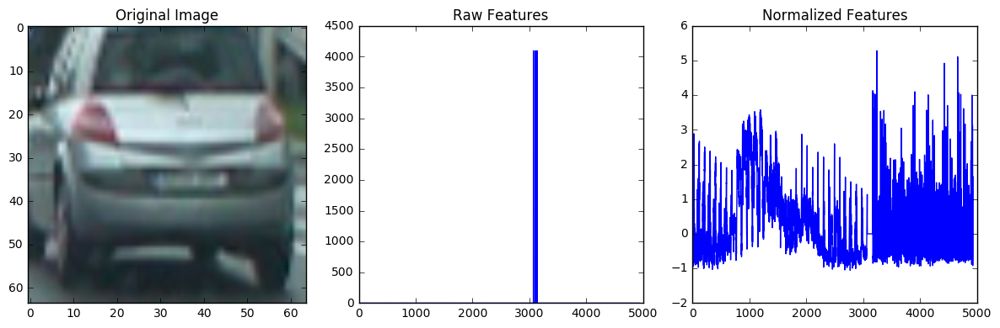

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler
import glob
from skimage.feature import hog

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        # Use skimage.hog() to get both features and a visualization
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        # Use skimage.hog() to get features only
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
        return features
    
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

###### TODO ###########
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        
        #Gaussian blur
        kernel_size = 5
        image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
        
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

images = glob.glob('OwnCollection/*/Right/*.png')
cars = []
notcars = []
for image in images:
    if 'non-vehicle' in image:
        notcars.append(image)
    else:
        cars.append(image)

color_space = 'YCrCb' #'good YCrCb' #'not good HLS' #'not good HSV' #'good YUV' #'LUV' #'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 ##2 # HOG cells per block
hog_channel = "ALL" #0 # Can be 0, 1, 2, or "ALL"
spatial_size = (4,4) #(8,8) #(16, 16) # Spatial binning dimensions
hist_bins = 8 #16    # Number of histogram bins
spatial_feat = False # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

car_features = extract_features(cars, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True)

notcar_features = extract_features(notcars, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True)

if len(car_features) > 0:
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64) 
    
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    car_ind = np.random.randint(0, len(cars))
    #print("car index: {}".format(car_ind))
    
    # Plot an example of raw and scaled features
    fig = plt.figure(figsize=(12,4))
    plt.subplot(131)
    plt.imshow(mpimg.imread(cars[car_ind]))
    plt.title('Original Image')
    plt.subplot(132)
    plt.plot(X[car_ind])
    plt.title('Raw Features')
    plt.subplot(133)
    plt.plot(scaled_X[car_ind])
    plt.title('Normalized Features')
    fig.tight_layout()
    plt.show()
    
else: 
    print('Your function only returns empty feature vectors...')
    


- Implement a sliding-window technique and use your trained classifier to search for vehicles in images.


In [ ]:
import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage.feature import hog
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        
        #Gaussian blur
        kernel_size = 5
        image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
        
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.2, 0.2)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
#from lesson_functions import *
# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.cross_validation import train_test_split

# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images


def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows
    
def find_car2(image, x_start_stop, y_start_stop, xy_window, 
              xy_overlap, svc, X_scaler, color_space, 
              spatial_size, hist_bins, orient, pix_per_cell, 
              cell_per_block, hog_channel, spatial_feat, 
              hist_feat, hog_feat):
    
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255

    #draw bbox_list
    windows = slide_window(image, x_start_stop=[800, None], y_start_stop=y_start_stop, 
                xy_window=(100, 100), xy_overlap=(0.2, 0.2))
    #print("window boxes: {}".format(windows))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    orient=orient, pix_per_cell=pix_per_cell, 
                    cell_per_block=cell_per_block, 
                    hog_channel=hog_channel, spatial_feat=spatial_feat, 
                    hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    
    #print("hot_windows: {}".format(hot_windows)) #hot_windows: [((864, 400), (960, 496))]
    #plt.imshow(window_img)
    #plt.show()
    return window_img, hot_windows
    
#*******************************************************************
#main program
# Read in cars and notcars
# Read in our vehicles and non-vehicles
images = glob.glob('OwnCollection/*/*/*.png')
cars = []
notcars = []

for image in images:
    if 'non-vehicle' in image:
        notcars.append(image)
    else:
        cars.append(image)
        
#add the false positives back to the not cars dataset for back annotation
images = glob.glob("negativeMiningImgs/*.png")
carImages = glob.glob("missingDetections/*.png")
print("Number of missing car detections: {}".format(len(carImages)))
for j in range(25):
    for image in images:
        notcars.append(image)
 
    #add the same number of car images back so the number of notcars and cars dataset are the same
    for i in range(len(images)):
        cars.append(cars[i])
    
# Reduce the sample size because
# The quiz evaluator times out after 13s of CPU time
sample_size = len(notcars) #cars) #550 #800 #300 #500
cars = cars[0:sample_size]
notcars = notcars[0:sample_size]

### TODO: Tweak these parameters and see how the results change.
color_space = 'YCrCb' #YUV just as good as YCrCb' #'YCrCb' ##'YCrCb' #'good YCrCb' #'not good drawing wrong boxes HLS' #'not good drawing wrong boxes HSV' #'good but still drawing wrong boxes YUV' #'has inficity LUV' #'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 8 ##8 #14 #not good 18 #not good 8 #better 11 #9  # HOG orientations
pix_per_cell = 8 ##9 #9 #8 #good still drawing wrong boxes 7 #no good 5 #not good 10 #6 good still drawing few wrong boxes #not good drawing wrong boxes 4 #8 good still drawing a few wrong boxes # HOG pixels per cell
cell_per_block = 2 ##2 # HOG cells per block
hog_channel = "ALL" #0 # Can be 0, 1, 2, or "ALL"
spatial_size = (4, 4) #(32, 32) ##(3,3) #(4,4) #(8,8) #(16, 16) # Spatial binning dimensions
hist_bins = 8 ##8 #16    # Number of histogram bins
spatial_feat = True ##False ##True # Spatial features on or off
hist_feat = True ##True Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, 550] #[None, None] # Min and max in y to search in slide_window()

print("-----------------------------------------------------------------------------------")
print("Parameters: color space:{}, spatial_size:{}, hist_bins:{}".format(color_space, spatial_size, hist_bins))
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = 17 #(not as good as 17) 3 #17 ##96 #np.random.randint(0, 100) #96 #17 #no good 98 #no good 82 #no good 22 #no good 76
print("rand_state: {}".format(rand_state))
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

# Check the prediction time for a single sample
t=time.time()

fnames = glob.glob('test_images/test*.jpg')
xy_window=(100, 100)
xy_overlap=(0.2, 0.2)
x_start_stop=[800, None]
for fname in fnames:
    print("File name: {}".format(fname))
    print("------------------------------------------------------------------------")
    image = mpimg.imread(fname) #'test_images/test1.jpg') #bbox-example-image.jpg')
    window_img, hot_windows = find_car2(image, x_start_stop, y_start_stop, 
                    xy_window, xy_overlap, svc, X_scaler, color_space, 
                        spatial_size, hist_bins, 
                        orient, pix_per_cell, 
                        cell_per_block, 
                        hog_channel, spatial_feat, 
                        hist_feat, hog_feat)
    plt.imshow(window_img)
    plt.show()

c:\users\blei\appdata\local\continuum\miniconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Number of missing car detections: 2
-----------------------------------------------------------------------------------
Parameters: color space:YCrCb, spatial_size:(4, 4), hist_bins:8


In [10]:
import numpy as np
import cv2
from skimage.feature import hog
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from scipy.ndimage.measurements import label

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat):
    
    draw_img = np.copy(img)
    img = area_of_interest(img) #add mask to only draw box on area of interest
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    #get the list of boxes
    bbox_list = []
    bbox = []
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            #print("spatial_features size: {}".format(spatial_features.shape))
            #print("hog_features size: {}".format(hog_features.shape))
            #print("hist_features size: {}".format(hist_features.shape))
            if (spatial_feat == True) & (hist_feat == True) & (hog_feat == True):
                test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            elif (spatial_feat == False) & (hist_feat == True) & (hog_feat == True):
                test_features = X_scaler.transform(np.hstack((hist_features, hog_features)).reshape(1, -1))
            elif (spatial_feat == False) & (hist_feat == False) & (hog_feat == True):
                test_features = X_scaler.transform(np.hstack((hog_features)).reshape(1,-1))
            elif (spatial_feat == False) & (hist_feat == True) & (hog_feat == False):
                test_features = X_scaler.transform(np.hstack((hist_features)).reshape(1,-1))
            elif (spatial_feat == True) & (hist_feat == False) & (hog_feat == False):
                test_features = X_scaler.transform(np.hstack((spatial_features)).reshape(1,-1))
            elif (spatial_feat == True) & (hist_feat == False) & (hog_feat == True):
                test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1,-1))
            elif (spatial_feat == True) & (hist_feat == True) & (hog_feat == False):
                test_features = X_scaler.transform(np.hstack((spatial_features, hist_features)).reshape(1,-1))
           
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                #get a box
                bbox = ((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart))
                bbox_list.append(bbox)
                #print("rectangle box: ({}, {}), ({}, {})".format(xbox_left, ytop_draw+ystart, xbox_left+win_draw,ytop_draw+win_draw+ystart))
    #print("Actual bbox_list: {}".format(bbox_list))
    return draw_img, bbox_list



def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def area_of_interest(img): 
    # Create a black image
    polygon_img = np.zeros(img.shape, np.uint8) 

    # Draw a polygon
    #pts = np.array([[620,410],[1280,410],[1280,720],[800,720]], np.int32) 
    pts = np.array([[630,370], [1000,370], [1000,img.shape[0]]], np.int32) #[700, 400], [1000,400], [1000,720]], np.int32)
    pts = pts.reshape((-1,1,2))
    #cv2.polylines(img,[pts],True,(0,255,255))
    cv2.fillPoly(polygon_img, pts =[pts], color=(255,255,255))

    # draw 2nd polygon
    # Draw a polygon
    #pts = np.array([[620,380],[1280,380],[1280,410],[620,410]], np.int32) 
    pts = np.array([[1000, 370], [img.shape[1], 370], [img.shape[1], img.shape[0]], [1000,img.shape[0]]], np.int32) #[1000, 400], [1280, 400], [1280, 720], [1000, 720]], np.int32)
    pts = pts.reshape((-1,1,2))
    #cv2.polylines(img,[pts],True,(0,255,255))
    cv2.fillPoly(polygon_img, pts =[pts], color=(255,255,255))

    #print("polygon_img size: {}".format(polygon_img.shape))
    #Display the image
    #cv2.imshow("polygon_Img",polygon_img)

    masked_data = cv2.bitwise_and(img, img, mask=polygon_img[:,:,1])
    return masked_data


def heatmapGen(fnames, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat, last_boxes):
    for fname in fnames:
        print("File name: {}".format(fname))
        print("---------------------------------------------------------------------------------")
        img = mpimg.imread(fname) #'test_images/test4.jpg')  
        
        #Gaussian blur
        kernel_size = 5
        img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
        
        out_img, box_list = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)
        
        last_boxes.append(box_list)
        
        if (len(last_boxes) > 5):
            last_boxes = last_boxes[-5:]
            
        #xy_window=(100, 100)
        #xy_overlap=(0.5, 0.5)
        #x_start_stop=[800, None]

        #out_img, box_list = find_car2(img, x_start_stop, y_start_stop, 
        #            xy_window, xy_overlap, svc, X_scaler, color_space, 
        #                spatial_size, hist_bins, 
        #                orient, pix_per_cell, 
        #                cell_per_block, 
        #                hog_channel, spatial_feat, 
        #                hist_feat, hog_feat)

        #display image only on area of interest
        #print("Masked image")
        #plt.imshow(area_of_interest(img))
        #plt.show()
        print("Original image")
        plt.imshow(img)
        plt.show()
        print("After drawing boxes:")
        plt.imshow(out_img)
        plt.show()
        
        # Read in image similar to one shown above 
        image = out_img #mpimg.imread('test_image.jpg')
        heat = np.zeros_like(image[:,:,0]).astype(np.float)

        # Add heat to each box in box list
        heat = add_heat(heat, [bbox for box_list in last_boxes for bbox in box_list]) #box_list)
    
        # Apply threshold to help remove false positives
        heat = apply_threshold(heat,5) #1)

        # Visualize the heatmap when displaying    
        heatmap = np.clip(heat, 0, 255)

        # Find final boxes from heatmap using label function
        labels = label(heatmap)
        print(labels[1], 'cars found.')
        #print("Before drawing labeled heatmap boxes:")
        #plt.imshow(img)
        #plt.show()
        draw_img = draw_labeled_bboxes(np.copy(img), labels)

        print("After drawing labeled heatmap boxes:")
        fig = plt.figure()
        plt.subplot(121)
        plt.imshow(draw_img)
        plt.title('Car Positions')
        plt.subplot(122)
        plt.imshow(heatmap, cmap='hot')
        plt.title('Heat Map')
        fig.tight_layout()
        plt.show()
    
#main program
#store the previous bbox initialization
last_boxes = []

ystart = 400 #370
ystop = 656
scale = 1.5
#fnames = glob.glob('test_images/test*.jpg')
#heatmapGen(fnames, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)
fnames = glob.glob('negativeMiningJPGs/*.jpg')
heatmapGen(fnames, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat, last_boxes)

#generate false positive files for back annotation
fnames = glob.glob('negativeMiningJPGsnotcars/*.jpg')
#initialize file count
fcount = 0

for fname in fnames:
    print("File name: {}".format(fname))
    print("-------------------------------------------------------------------------------")
    img = mpimg.imread(fname)
    out_img, box_list = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)
    #print(img.shape)
    #print(len(box_list))
    for i in range(len(box_list)):
        #print("box_list[{}]: {}".format(i,box_list[i]))
        box_cord = box_list[i]
        #print("box cord[0][0]: {}".format(box_cord[0][0]))
        #print("box cord[1][0]: {}".format(box_cord[1][0]))
    
        boxImg = img[box_cord[0][1]:box_cord[1][1], box_cord[0][0]:box_cord[1][0], :]
        boxImg = cv2.resize(boxImg, (64,64))
        plt.imshow(boxImg)
        plt.show()
        box_cordName="_".join([str(box_cord[0][0]), str(box_cord[0][1]), str(box_cord[1][0]), str(box_cord[1][1]), str(fcount)])
        fileName = "".join(['negativeMiningJPGsnotcars/negativeMiningImgs/', box_cordName])
        plt.imsave(fileName, boxImg)
        fcount += 1
        

NameError: name 'svc' is not defined

- Run my advanced lane finding pipeline first.  The details are explained as follow:
    a) Calibrate the camera.
    b) Undistort the lane image.
    c) Warp the lane image to find the lanes.
    d) Unwarp the lane lines back to the original lane image.
- Run my vehicle detection pipeline second on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.  The detailed description is below:
    a) Train and validate a linear SVM machine on test images based on provide Udacity image dataset
    b) Use local SVM trained label to detect vehicles on the advanced lane finding image by calibrating the color 
        space, the color channels, the spatial size, the hog channel size, the hog orientation, the pixels per cell, 
        and cell per block parameters, which takes a lot of time by experiementing with various parameters.
    c) Use heat map algorithm with the calibrated threshold to eliminate false detections
    d) Run a video stream to generate the video detection and lane finding output video stream

In [ ]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
#%matplotlib qt
import numpy.polynomial.polynomial as poly

import math
import moviepy
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
#%matplotlib qt
import matplotlib.image as mpimg

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

#function to calibrate the camera
def calibrate(images, nx, ny):
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)        
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.set_title('Original Image', fontsize=18)
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        
    # Use cv2.calibrateCamera and cv2.undistort()
    img_size = (img.shape[1], img.shape[0])

    #Camera calibration, given object points, image points, and the shape of the grayscale image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
    #print("mtx coefficient: {}".format(mtx))
    #print("dist coefficient: {}".format(dist))
    return mtx, dist

#function to undistort images
def undistort(images, nx, ny, mtx, dist):
    #initialize the image count
    count = 0
    #get the image size
    for fname in images:
        img = cv2.imread(fname)
    imgShape = img.shape
    
    undistortImg = np.uint8(np.zeros((len(images),imgShape[0], imgShape[1], imgShape[2]))) #720,1280,3)))
    print("undistort initial image size: {}".format(undistortImg.shape))
    
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname) 
        #print("Image name: {}, image size: {}".format(fname, img.shape))
        
        #create empty matrix
        vis = np.uint8(np.zeros(((2*img.shape[0]), (2*img.shape[1]), 3)))
        #draw the original image first
        vis[:img.shape[0], :img.shape[1], :img.shape[2]] = img
            
        #1) Undistort using mtx and dist
        img = cv2.undistort(img, mtx, dist, None, mtx)
        # 2) Convert to grayscale
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)  
            
        #combine 2 images
        vis[:img.shape[0], img.shape[1]:2*img.shape[1], :img.shape[2]] = img
            
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        if ret == True:
            # For source points I'm grabbing the outer four detected corners
            src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
            #print("source[{}]: {}".format(count, src))
            # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
            # For destination points, I'm arbitrarily choosing some points to be
            # a nice fit for displaying our warped result 
            # again, not exact, but close enough for our purposes
            dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
            #print("destination[{}]: {}".format(count, dst))             
                
            # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
            M = cv2.getPerspectiveTransform(src, dst)
            #print("M[{}]: {}".format(count, M))
            # e) use cv2.warpPerspective() to warp your image to a top-down view
            warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)

            vis[:warped.shape[0], img.shape[1]:img.shape[1]+warped.shape[1], :warped.shape[2]] = warped
            
            #cv2.imshow('img', cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)) #warped)
            
            #store the undistorted warp image into img
            img = warped
        
            
        if (img.shape[0] == imgShape[0]) & (img.shape[1] == img.shape[1]):
            undistortImg[count] = img
        #print("undistortImg size: {}".format(undistortImg.shape))
 
        # Display the original and undistorted images
        print('Original Image and  Undistorted Image Comparison')
        plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
        plt.show()        
        
        count = count + 1
            
        cv2.waitKey(500)

    cv2.destroyAllWindows()
    undistortImg = undistortImg.reshape((-1, imgShape[0], imgShape[1], imgShape[2])).astype(np.float32)
    return undistortImg

#main program
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
# Make a list of calibration chessboard images
img = glob.glob('../CarND-Advanced-Lane-Lines-master/CarND-Advanced-Lane-Lines-master/camera_cal/calibration*.jpg')
#get the calibration information
mtx,dist = calibrate(img, nx, ny)
#undistort all the chessboard images
undistort(img, nx, ny, mtx, dist)


def area_of_interest2(img):
    # Create a black image
    polygon_img = np.zeros(img.shape, np.uint8) 

    # Draw a polygon
    pts = np.array([[495,410],[595,410],[325,img.shape[0]],[150,img.shape[0]]], np.int32) #323,495],[487,495],[230,img.shape[0]],[200,img.shape[0]]], np.int32)#200 change to 230 &0 to 200 temporary
    #pts = np.array([[319,500],[480,500],[319,610],[133,610]], np.int32)
    pts = pts.reshape((-1,1,2))
    #cv2.polylines(img,[pts],True,(0,255,255))
    cv2.fillPoly(polygon_img, pts =[pts], color=(255,255,255))

    # draw 2nd polygon
    # Draw a polygon
    pts = np.array([[670,410],[750,410],[1200,img.shape[0]],[825,img.shape[0]]], np.int32) #563,495],[689,495],[900,img.shape[0]],[820,img.shape[0]]], np.int32) #780changeto820&880to900
    #pts = np.array([[569,500],[689,500],[805,610],[689,610]], np.int32)
    pts = pts.reshape((-1,1,2))
    #cv2.polylines(img,[pts],True,(0,255,255))
    cv2.fillPoly(polygon_img, pts =[pts], color=(255,255,255))

    #print("polygon_img size: {}".format(polygon_img.shape))
    #Display the image
    #cv2.imshow("polygon_Img",polygon_img)

    masked_data = cv2.bitwise_and(img, img, mask=polygon_img[:,:,1])
    return masked_data
def warp(img, src_corners, dst_corners):
    # Pass in your image into this function
    # Write code to do the following steps
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    
    #offset to expand the warped image boundary in the x direction
    #offset = 515 #too wide 250 #too wide130 #??looks good 190 #??looks good 180 #??too wide 100 #350 #still little bit too wide150 #200 #300
    #[topright, bottomright,bottomleft, topleft] 
    
    # For source points I'm grabbing the outer four detected corners
    src = np.float32(src_corners) 
    #print("source: {}".format(src))
    # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    #get the src x values
    xsrc = [src[0][0], src[1][0], src[2][0], src[3][0]]
    #get min and max src x values
    minx = min(xsrc)
    maxx = max(xsrc)
    
    #get the src y values
    ysrc = [src[0][1], src[1][1], src[2][1], src[3][1]]
    #get min and max src y values
    miny = min(ysrc)
    maxy = max(ysrc)
    
    #[topright, bottomright,bottomleft, topleft] 
    dst = np.float32(dst_corners) #np.float32([[img_size[0]-offset, 0],  #top right
            #[img_size[0]-offset, img_size[1]],  #bottom right                        
            #[offset, img_size[1]],  #bottom left
            #[offset, 0]])  #top left
    
    #print("destination: {}".format(dst))
    
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    #print("M: {}".format(M))
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    #plt.imshow(warped)
    #plt.show()
    return warped
def pipeline(img, s_thresh=(120, 255), sx_thresh=(20, 100)): #s_thresh=(120, 255), sx_thresh=(20, 100)
    img = np.copy(img)
    
    # Gaussian Blur
    kernel_size = 5
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    # Convert to HLS color space and separate the S channel
    #hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Masked area
    color_binary = area_of_interest2(color_binary)
    return color_binary

# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output


def find_polynom(leftxArray, rightxArray, imgShape):
    #print(imgShape[0])
    ploty = np.linspace(0, imgShape[0]-1, num = imgShape[0]) #719, num = 720) #cover same as the image
    
    leftx = np.array([0 for y in ploty]) #leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = np.array([0 for y in ploty]) #rightx[::-1]  # Reverse to match top-to-bottom in y
    for i in range(imgShape[0]): #720):
        leftx[i] = np.argmax(leftxArray[i])
        rightx[i] = np.argmax(rightxArray[i])
        #print("leftx[{}]: {}".format(i, leftx[i]))
        #print("rightx[{}]: {}".format(i, rightx[i]))
        
    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    #plot the 2nd order polynomial equation
    #x_new is from 0 to image shape[1]
    #x_new = np.linspace(0, imgShape[1]-1, num=imgShape[1])
    #ffit = poly.polyval(x_new, left_fit)
    #plt.plot(x_new, ffit)
    #plt.show()
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    #print("ploty: {}".format(ploty))
    #print("ploty in polynom shape: {}".format(ploty.shape))
    #print("left_fitx in polynom shape: {}".format(left_fitx.shape))
    #print("right_fitx shape: {}".format(right_fitx.shape))
    
    #print("Right fit x = {}".format(right_fit))
    return leftx, left_fit, left_fitx, rightx, right_fit, right_fitx, ploty

def curvatureFunc(ploty, left_x, right_x) : #left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    #y_eval = np.max(ploty)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    yval = np.max(ploty) #img.shape[1]
    left_y = ploty
    right_y = ploty
    
    left_fit_cr = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*yval + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*yval + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])

    print("Left curvature: {}, Right curvature: {}".format(left_curverad, right_curverad))
    return left_curverad, right_curverad

#Example values: 632.1 m    626.2 m

def vehicle_position(pos, width, result):
    #calculate the position of the vehicle
    position = width/2 #image.shape[1]/2
    left = np.min(pos)
    right = np.max(pos)
    center = (left + right)/2

    #Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 #meters per pixel in x dimension
    position = (position -center)*xm_per_pix
    return position


def find_window_centroids(warped, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
	    # convolve the window into the vertical slice of the image
	    image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
	    conv_signal = np.convolve(window, image_layer)
	    # Find the best left centroid by using past left center as a reference
	    # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
	    offset = window_width/2
	    l_min_index = int(max(l_center+offset-margin,0))
	    l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
	    l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
	    # Find the best right centroid by using past right center as a reference
	    r_min_index = int(max(r_center+offset-margin,0))
	    r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
	    r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
	    # Add what we found for that layer
	    window_centroids.append((l_center,r_center))

    return window_centroids
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

def draw_Vlanes(img, warped, ploty, left_fitx, right_fitx, src_corners, dst_corners):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(src_corners)
    dst = np.float32(dst_corners) 

    Minv = cv2.getPerspectiveTransform(dst, src)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)

    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    #print("color warp image:")
    #plt.imshow(color_warp)
    #plt.show()
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    #print("left_fitx shape: {}".format(left_fitx.shape))
    #print("ploty shape: {}".format(ploty.shape))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    #print("pts_left size: {}".format(pts_left.shape))
    #print("pts_left: {}".format(pts_left))
    #print("pts_right size: {}".format(pts_right.shape))
    #print("pts_right: {}".format(pts_right))
    #print("pts size: {}".format(pts.shape))
    #print("color_warp size: {}".format(color_warp.shape))
    #print("np.int_([pts]) size: {}".format(np.int_([pts]).shape))
    #print("np.int_([pts]): {}".format(np.int_([pts])))
    # Draw the lane onto the warped blank image
    #cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    #print("color warp image after fillpoly:")
    #plt.imshow(color_warp)
    #plt.show()
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
    #print("New warp image size: {}".format(newwarp.shape))
    #plt.imshow(newwarp)
    #plt.show()
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
    #print("Combine result image: {}".format(result.shape))
    
    #plt.imshow(result)
    #plt.show()
    return pts, img.shape[1], result

#just one image file only

def colorThreshImage(img, src_corners, dst_corners):
    #img = cv2.imread(fname)
    result = pipeline(img)
    warpimg = warp(result, src_corners, dst_corners)
    #plt.imshow(result)
    #plt.show()
    #plt.imshow(warpimg)
    #plt.show()
    return warpimg

def sanity_check(laneline, curverad, fitx, fit):       
    # Sanity check for the lane
    if (laneline.detected): # If lane is detected
        #print("Lane line detected.")
        # If sanity check passes
        if (abs(curverad / laneline.radius_of_curvature - 1) < .6):        
            laneline.detected = True
            laneline.current_fit = fit
            laneline.allx = fitx
            laneline.bestx = np.mean(fitx)            
            laneline.radius_of_curvature = curverad
            laneline.current_fit = fit
            #print("Sanity check passes.")
        # If sanity check fails use the previous values
        else:
            laneline.detected = False
            fitx = laneline.allx
            #print("Sanity check fails.")
    else:
        #print("Lane line not detected.")
        # If lane line was not detected and no curvature is defined
        if laneline.radius_of_curvature: 
            if abs(curverad / laneline.radius_of_curvature - 1) < 1:            
                laneline.detected = True
                laneline.current_fit = fit
                laneline.allx = fitx
                laneline.bestx = np.mean(fitx)            
                laneline.radius_of_curvature = curverad
                laneline.current_fit = fit
                #print("No curvature is defined.")
            else:
                laneline.detected = False
                fitx = laneline.allx      
                #print("Curvature is defined.")
        # If curvature was defined
        else:
            laneline.detected = True
            laneline.current_fit = fit
            laneline.allx = fitx
            laneline.bestx = np.mean(fitx)
            laneline.radius_of_curvature = curverad
    return fitx

#just one file
def process_image2(img):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    #plt.imshow(img)
    #plt.show()
    
    #1)must adjust the src_corners, dst_corners, and offset on every new video unless the camera has not move at all
    offset = 150 #515
    src_corners = [(749,455),(1161,img.shape[0]),(170,img.shape[0]),(483,455)] #[(668,410), (1161, img.shape[0]), (170, img.shape[0]), (538,410)] #[(617, 485), (830, img.shape[0]), (121, img.shape[0]), (440, 485)] #[(697, 455), (1127,720), (203, 720), (580, 455)] #[(695, 460), (1127,720), (203, 720), (585, 460)] #[(688,450), (1115, 717), (195,717),(591,450)] #[(738, 485), (1108, 717), (207,717), (548,485)]
    dst_corners = [(img.shape[1]-offset, 0), (img.shape[1]-offset, img.shape[0]), (offset, img.shape[0]), (offset,0)]
    #print("source corners: {}".format(src_corners))
    
    # window settings
    window_width = 50 
    window_height = img.shape[0]/9 #for example window_height =80 # Break image into 9 vertical layers since image height is 720
    #print("window height: {}, vertical image shape: {}".format(window_height, img.shape[0]))
    margin = 100 # How much to slide left and right for searching

    warped = colorThreshImage(img, src_corners, dst_corners) #mpimg.imread(warpedFnames[iName]) #"comboWarp/warpimg7.png") #'warped-example.jpg')
    #add all channels into one channel
    #print("warped channel size: {}".format(warped.shape[2]))
    if (warped.shape[2] == 4):
        warpedS = warped[:,:,0] + warped[:,:,1] + warped[:, :, 2] + warped[:, :, 3]
    elif (warped.shape[2] == 3):
        warpedS = warped[:,:,0] + warped[:,:,1] + warped[:,:,2]
    warped = warpedS
    
    #plt.imshow(warped)
    #plt.show()
    
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        #print("r_points shape: {}".format(r_points.shape))
        
        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel 
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        #print("new centroids output image:")
        #plt.imshow(output)
        #plt.show()
        
        #find the polynomials
        leftx, left_fit, left_fitx, rightx, right_fit, right_fitx, ploty = find_polynom(l_points, r_points, img.shape)
        #find the curvatures
        #left_curverad, right_curverad = curvatureFunc(ploty, left_fitx, right_fitx)
    
        #print("left_fitx shape before sanity check: {}".format(left_fitx.shape))
        # Sanity check for the lanes
        #print("Left lane sanity check:")
        #left_fitx  = sanity_check(left_lane, left_curverad, left_fitx, left_fit)
        #print("Right lane sanity check:")
        #right_fitx = sanity_check(right_lane, right_curverad, right_fitx, right_fit)
    
        #print("left_fitx shape after sanity check: {}".format(left_fitx.shape))
        #draw lines on image
        pts, width, result =  draw_Vlanes(img, warped, ploty, left_fitx, right_fitx, src_corners, dst_corners)
    
        pos = []
        for i in range(pts.shape[1]):
            pos.append(pts[0][i][0])
        #print(pos)
        #vehicle position
        position =  vehicle_position(np.array(pos), width, result)
        #print("Vechicle position: {}".format(position))
    
        font = cv2.FONT_HERSHEY_SIMPLEX
        if (position < 0):
            imgText = 'Vehicle is {:.2f}m left of center'.format(-position)
        else:
            imgText= 'Vehicle is {:.2f}m right of center'.format(position)
        cv2.putText(result, imgText, (400,150), font, 1, (255,255,255), 2)

        #curvature = int((left_curverad+right_curverad)/2)
        #newimgText = 'Radius of Curvature: {}m'.format(int(curvature))
        #cv2.putText(result, newimgText, (400, 100), font, 1, (255, 255,255), 2)
        
    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    return result
 
#main
# Set up lines for left and right
left_lane = Line()
right_lane = Line()

dir = "test_images/test_image" #"../CarND-Advanced-Lane-Lines-master/CarND-Advanced-Lane-Lines-master/test_images/test" #"test_images3/test_image"
for i in range(1,18):
    FNum = "".join([dir, str(i+1)])
    FName = ".".join([FNum, "jpg"])
    print("File name: {}".format(FName))
    #plt.imshow(cv2.imread(FName))
    #plt.imsave("mask", area_of_interest2(cv2.imread(FName)))
    #plt.show()
    #plt.imshow(area_of_interest2(cv2.imread(FName)))
    #plt.show()
    print("test image shape: {}".format(cv2.imread(FName).shape))
    print("------------------------------------------------------------")
    plt.imshow(cv2.cvtColor(process_image2(cv2.imread(FName)), cv2.COLOR_BGR2RGB))
    plt.show()
    
 

In [2]:
import math
import moviepy
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def drawImgSingleFrame2(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, 
                        spatial_size, hist_bins):
    xy_window=(100, 100)
    xy_overlap=(0.2, 0.2)
    x_start_stop=[800, None]

    out_img, box_list = find_car2(img, x_start_stop, y_start_stop, 
            xy_window, xy_overlap, svc, X_scaler, color_space, 
            spatial_size, hist_bins, 
            orient, pix_per_cell, 
            cell_per_block, 
            hog_channel, spatial_feat, 
            hist_feat, hog_feat)
    return out_img


def drawImgSingleFrame(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, 
                       spatial_size, hist_bins, last_boxes):
    out_img, box_list = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, 
                                  spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)
    #to reduce the false positives
    last_boxes.append(box_list)
    if (len(last_boxes) > 5):
        last_boxes = last_boxes[-5:]
        
        
    # Read in image similar to one shown above 
    image = out_img #mpimg.imread('test_image.jpg')
    heat = np.zeros_like(image[:,:,0]).astype(np.float)

    # Add heat to each box in box list
    heat = add_heat(heat, [bbox for box_list in last_boxes for bbox in box_list]) #box_list)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,5) #1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    #print(labels[1], 'cars found.')
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

def process_image(img):
    drawimg = drawImgSingleFrame(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, 
                                 cell_per_block, spatial_size, hist_bins, last_boxes)
    #print("draw box image size: {}, original image size: {}".format(drawimg.shape, img.shape))
    #blend original image with heat map
    result = drawimg #cv2.addWeighted(img,0.5,hmap,0.5,0)
    return result

def process_image5(img):
    drawimg = drawImgSingleFrame2(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, 
                                  cell_per_block, spatial_size, hist_bins)
    result = drawimg
    return result

def laneFinding(Vin, Vout):
    #This subroutine outputs a lane finding image.
    #Vin is the input image file.
    #Vout is the output image file.
    #for avi files
    clipl = VideoFileClip(Vin)
    white_clip = clipl.fl_image(process_image2)
    %time white_clip.write_videofile(Vout, audio=False, fps=30, codec='mpeg4') 
    return Vout

def videoAnnotate3(VideoIn, VideoOut):
    #This subroutine annotate the initial video
    #with annotated lane markers.
    #output video file name
    HTML("""
    <video width="960" height="540" controls>
    <source src="(0)" >
    </video>
    """.format(laneFinding(VideoIn, VideoOut)
              ))
    
def vehicleFinding(Vin, Vout):
    #This subroutine outputs an image.
    #Vin is an input image file name.
    #Vout is an output image file name.
    clip1 = VideoFileClip(Vin) #"solidWhiteRight.mp4")
    white_clip = clip1.fl_image(process_image3) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(Vout, audio=False) 
    return Vout

def vehicleFinding2(Vin, Vout):
    clip1 = VideoFileClip(Vin)
    white_clip = clip1.fl_image(process_image6)
    %time white_clip.write_videofile(Vout, audio=False)
    return Vout

def videoAnnotate(VideoIn, VideoOut):
    #This subroutine annotate the initial video
    # with annotated lane markers.
    #output video file name
    HTML("""
    <video width="960" height="540" controls>
    <source src="{0}">
    </video>
    """.format(vehicleFinding(VideoIn, VideoOut) 
          ))
    
def process_image3(img):
    img2 = process_image2(img) #detect the lanes first
    result = process_image(img2) #detect the vehicles second
    return result

def process_image6(img):
    img5 = process_image2(img) #detect the lanes first
    result = process_image5(img5) #detect the vehicles second
    return result

def videoAnnotate2(VideoIn, VideoOut):
    HTML("""
    <video width="960" height="540" controls>
    <source src="{0}">
    </video>
    """.format(vehicleFinding2(VideoIn, VideoOut)
              ))
    

#main program
#initialize the previous window boxes
last_boxes = []

#img = mpimg.imread("test_images/test1.jpg")
#FName = "test_images/test1.jpg"
#plt.imshow(img)
#plt.show()
#img2 = cv2.cvtColor(process_image2(cv2.imread(FName)), cv2.COLOR_BGR2RGB)
#plt.imshow(process_image(img2))
#plt.show()

#vehicleFinding2("project_video.mp4", "searchWindowsMethod_video.mp4")
#Annotate videos
#using the search hot windows method from the lecture
#videoAnnotate2("project_video.mp4", "searchWindowsMethod_video.mp4")
#using the HOG sub-sampling window search method from the lecture
videoAnnotate3("MOVI0009upto72sec.mp4", "MOVI0009upto72secLaneFinding.mp4")
#videoAnnotate3("MOVI0019.avi", "MOVI0019LaneFinding.avi")
#videoAnnotate3("E:/carVideo4_4_17/MOVI0004.avi", "MOVI0004LaneFinding.avi")
#videoAnnotate3("E:/carVideo4_4_17/MOVI0003.avi", "MOVI0003LaneFinding.avi")



[MoviePy] >>>> Building video MOVI0009upto72secLaneFinding.mp4
[MoviePy] Writing video MOVI0009upto72secLaneFinding.mp4


100%|██████████████████████████████████████████████████████████████████████████████| 2165/2165 [11:26<00:00,  2.91it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: MOVI0009upto72secLaneFinding.mp4 

Wall time: 11min 26s
